<a href="https://colab.research.google.com/github/DSAGRO3F/VAE_MNIST/blob/main/vae_mnist.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Colab environement

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip3.10 install virtualenv
!virtualenv env
!source /content/env/bin/activate

created virtual environment CPython3.10.12.final.0-64 in 281ms
  creator CPython3Posix(dest=/content/env, clear=False, no_vcs_ignore=False, global=False)
  seeder FromAppData(download=False, pip=bundle, setuptools=bundle, wheel=bundle, via=copy, app_data_dir=/root/.local/share/virtualenv)
    added seed packages: pip==24.0, setuptools==69.5.1, wheel==0.43.0
  activators BashActivator,CShellActivator,FishActivator,NushellActivator,PowerShellActivator,PythonActivator


# Import modules

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.manifold import TSNE

In [ ]:
import torch
import torchvision
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
from torchvision.io import read_image

In [ ]:
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import Adam
from torch.utils.data import TensorDataset, random_split
from torch.autograd import Variable

In [ ]:
import torch.nn as nn
from torchvision.datasets import MNIST
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from mpl_toolkits.axes_grid1 import ImageGrid
from torchvision.utils import save_image, make_grid
from torchvision.transforms import ToTensor, v2

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Available_device: {device}')

Available_device: cpu


# Load data

In [ ]:
mnist_trainset = datasets.MNIST(root='/Users/olivierdebeyssac/Python_VAE/', train=True, download=True, transform=ToTensor())

In [ ]:
mnist_testset = datasets.MNIST(root='/Users/olivierdebeyssac/Python_VAE/', train=False, download=True, transform=ToTensor())

In [ ]:
print('len train set: {}'.format(len(mnist_trainset)))
print('len test set: {}'.format(len(mnist_testset)))

print('shape train set: {}'.format(type(mnist_trainset)))

len train set: 60000
len test set: 10000
shape train set: <class 'torchvision.datasets.mnist.MNIST'>


# Load data in container

In [ ]:
batch_size = 1

In [ ]:
train_loader = torch.utils.data.DataLoader(mnist_trainset, batch_size=batch_size, shuffle=True)

In [ ]:
print(type(train_loader))
print(len(train_loader))

<class 'torch.utils.data.dataloader.DataLoader'>
60000


## Build specific dataloader for one single image, img_0.

In [ ]:
for i, (image, label) in enumerate(train_loader):
  if i < 1:
    img_0 = image
    label_0 = label
    print('==========')
    print()
    #print(img_0)
    print('img_0.shape: {}'.format(img_0.shape))
    print()
    print('==========')
    print()
    print('label_0: {}'.format(label_0))
    print('label_0.shape: {}'.format(label_0.shape))
    print()
    print('==========')


img_0.shape: torch.Size([1, 1, 28, 28])


label_0: tensor([3])
label_0.shape: torch.Size([1])



## Display image.

In [ ]:
def display_img_0(x):
  fig, axes = plt.subplots(1, 1, figsize=(4, 4))
  x = x.detach().numpy()
  x = x.reshape(28, 28, 1)
  fig = plt.imshow(x)


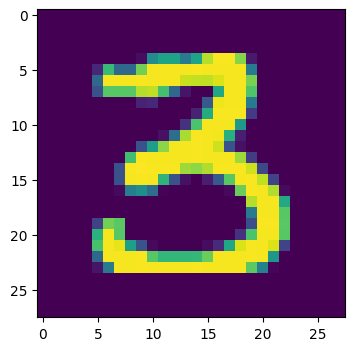

In [ ]:
display_img_0(img_0)

In [ ]:
class dataset_img_0():
  # torch.utils.data.dataset
  def __init__(self, x, y):
    super(dataset_img_0, self).__init__()
    self.x = x
    self.y = y

  def __len__(self):
    return self.x.shape[0]

  def __getitem__(self, index):
    x = self.x[index, :, :, :]
    y = self.y[index]
    return x, y

In [ ]:
train_dataset_img_0 = dataset_img_0(img_0, label_0)

In [ ]:
train_loader_img_0 = torch.utils.data.DataLoader(train_dataset_img_0, batch_size=1)

## Prepare data for scatter: dimension reduction.

In [ ]:
def extract(loader):
  l_imgs = []
  l_labels = []
  for i, (x, y) in enumerate(loader):
    x = x.detach().numpy()
    x = x.reshape(-1, 28, 28)
    y = y.detach().numpy()

  return x, y

x_0, y_0 = extract(train_loader_img_0)
print('x_0.shape: {}, y_0.shape: {}'.format(x_0.shape, y_0.shape))

x_0.shape: (1, 28, 28), y_0.shape: (1,)


# Visualize batches

In [ ]:
def display_img(loader):
  n = 20 # Nb images à afficher
  n_cols = 5
  n_rows = n//n_cols
  figure, axes = plt.subplots(n_rows, n_cols, figsize = (9, 7))
  plt.tight_layout(pad=3.0)

  idxs = np.random.randint(0, 500, size=20)
  l_loader = list(enumerate(loader))
  samples = [element for element in l_loader if l_loader.index(element) in idxs]


  for k, ax in enumerate(axes.flatten()):
    print('k: {}'.format(k))
    img = samples[k][1][0]
    label = samples[k][1][1]
    img_np = img.detach().numpy()
    img_np = img_np.reshape(img.shape[2], img.shape[3])
    label_np = label.detach().numpy()
    ax.imshow(img_np)
    ax.set_title(label_np)
  plt.show()
  return



k: 0
k: 1
k: 2
k: 3
k: 4
k: 5
k: 6
k: 7
k: 8
k: 9
k: 10
k: 11
k: 12
k: 13
k: 14
k: 15
k: 16
k: 17
k: 18
k: 19


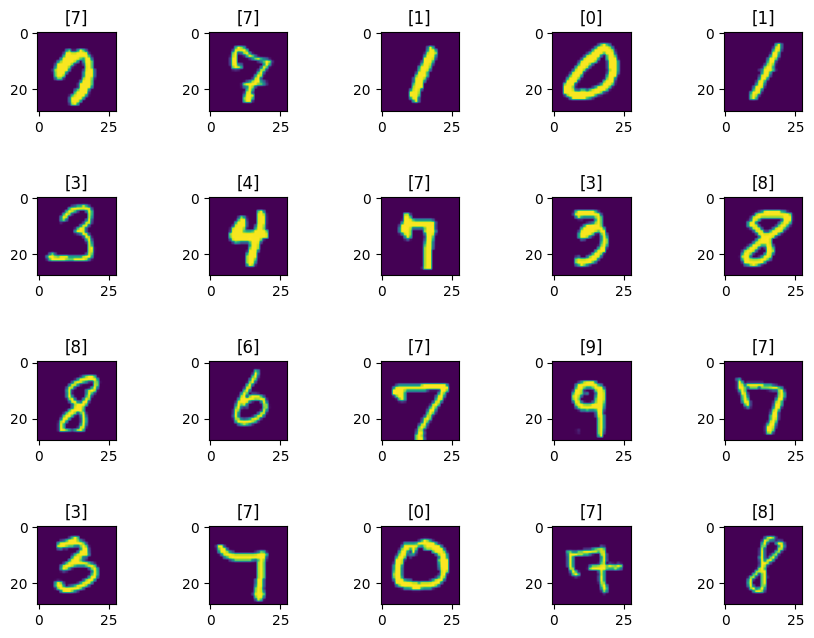

In [ ]:
display_img(train_loader)

# VAE with back propagation

## Initializing lists.

In [ ]:
l_x_hat = []
l_x_hat_img_0 = []

l_z_sampled = []
l_z_sampled_img_0 = []

l_labels = []
l_labels_img_0 = []

## Defining VAE model.

In [ ]:
class Vae(torch.nn.Module):

    def __init__(self):
        super(Vae, self).__init__()
        self.in_features_1 = 1 * 28 * 28
        self.out_features_1 = 200
        self.out_features_2 = 50
        self.latent_dim = 20

        self.encoder = nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features=self.in_features_1, out_features=self.out_features_1),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(in_features=self.out_features_1, out_features=self.out_features_2),
            nn.Dropout(0.2),
            nn.ReLU()
        )

        self.mean = nn.Linear(in_features=self.out_features_2, out_features=self.latent_dim)
        self.log_var = nn.Linear(in_features=self.out_features_2, out_features=self.latent_dim)

        self.decoder = nn.Sequential(nn.Linear(in_features=self.latent_dim, out_features=self.out_features_2),
                                     nn.Linear(in_features=self.out_features_2, out_features=self.out_features_1),
                                     nn.Linear(in_features=self.out_features_1, out_features=self.in_features_1),
                                     nn.Sigmoid()
                                    )
    def encod(self, x):
        #print('encod-input, x.shape: {}'.format(x.shape))
        x = self.encoder(x)
        #print('encod-output, x.shape: {}'.format(x.shape))
        mu = self.mean(x)
        log_var = self.log_var(x)
        return mu, log_var


    def reparametrization(self, mu, log_var):
        normal = torch.randn_like(mu)
        z = mu + torch.exp(log_var) * normal
        #print('mean_x output: {}'.format(mu.shape))
        #print('z output: {}'.format(z.shape))
        return z


    def decod(self, z):
        z = self.decoder(z)
        #print('z.shape): {}'.format(z.shape))
        return z


    def forward(self, x):
        mu, log_var = self.encod(x)

        z = self.reparametrization(mu, log_var)
        x_hat = self.decod(z)

        if np.array_equal(x, img_0):
          l_x_hat_img_0.append(x_hat.reshape(1, 28, 28))
          l_z_sampled_img_0.append(z)

        else:
          l_x_hat.append(x_hat.reshape(1, 28, 28))
          l_z_sampled.append(z)

        return x_hat, mu, log_var

In [ ]:
model = Vae()

## Defining Optilizer and loss functions.

In [ ]:
optimizer = Adam(model.parameters(), lr=1e-3)

In [ ]:
def loss_fn(x_hat, x, mu, log_var):
  reproduction_loss = nn.functional.binary_cross_entropy(input=x_hat, target=x, reduction='sum')
  KLD = - 0.5 * torch.sum(1+ log_var - mu.pow(2) - log_var.exp())
  return reproduction_loss + KLD



## Initaillizing lists related to loss values.

In [ ]:
l_loss = []
l_meanloss= []
l_labels = []

## Defining training function.

In [ ]:
def train(model, loader, optimizer, epochs):
  model.train()
  l_meanloss = []
  for epoch in range(epochs):
    l_loss = []

    for x, label in loader:
      x = x.to(device)

      if np.array_equal(x, img_0):
        l_labels_img_0.append(label)

      else:
        l_labels.append(label.detach().numpy())

      optimizer.zero_grad()
      x_hat, mu, log_var = model(x)
      x = x.reshape(1, 28*28)

      loss = loss_fn(x_hat, x, mu, log_var)
      l_loss.append(loss.detach().numpy())
      loss.backward()
      optimizer.step()

    mean_loss = np.mean(l_loss)
    print('epoch: {} -- loss value: {}'.format(epoch + 1, mean_loss))
    l_meanloss.append(mean_loss)

  return l_meanloss

## Runing model on train data set.

In [ ]:
epochs = 8
l_ = train(model, train_loader, optimizer, epochs=epochs)

epoch: 1 -- loss value: 160.4080047607422
epoch: 2 -- loss value: 152.73483276367188
epoch: 3 -- loss value: 151.8392333984375
epoch: 4 -- loss value: 151.49497985839844
epoch: 5 -- loss value: 151.39430236816406
epoch: 6 -- loss value: 151.14553833007812
epoch: 7 -- loss value: 151.01914978027344
epoch: 8 -- loss value: 151.06137084960938


## Dsisplay of loss function results (on train data set).

In [ ]:
def loss_display(l):
  df_loss = pd.DataFrame(l, columns=['loss'], index=range(len(l)))
  fig = px.line(df_loss, x=df_loss.index, y='loss')
  fig.show()
  df_loss = pd.DataFrame()
  return


In [ ]:
loss_display(l_)

# Making prints for chekings of dimension and format.

In [ ]:
print('------------ Begining of Prints --------------')
print('len(l_x_hat): {}, l_x_hat[0].shape: {}'.format(len(l_x_hat), l_x_hat[0].shape))
print('len(l_x_hat_img_0): {}, l_x_hat_img_0[0].shape: {}'.format(len(l_x_hat_img_0), l_x_hat_img_0[0].shape))
print()
print('------------')
print('len(l_z_sampled): {}, l_z_sampled[0].shape: {}'.format(len(l_z_sampled), l_z_sampled[0].shape))
print('len(l_z_sampled_img_0): {}, l_z_sampled_img_0[0].shape: {}'.format(len(l_z_sampled_img_0), l_z_sampled_img_0[0].shape))
print()
print('------------ End of Prints --------------')

------------ Begining of Prints --------------
len(l_x_hat): 479992, l_x_hat[0].shape: torch.Size([1, 28, 28])
len(l_x_hat_img_0): 8, l_x_hat_img_0[0].shape: torch.Size([1, 28, 28])

------------
len(l_z_sampled): 479992, l_z_sampled[0].shape: torch.Size([1, 20])
len(l_z_sampled_img_0): 8, l_z_sampled_img_0[0].shape: torch.Size([1, 20])

------------ End of Prints --------------


# Visualisation of one sigle reconstructed image, Outputs from decoder layer.

- Based on the same reconstructed image, we want to compare images among all of them and see smooth transformation from one reconstructed image to next one.
- In order to do so, in an arbitrary way, we select one single image from original dataset and display what the model generates as new images.

## Training function for particular case of one single image, img_0.

In [ ]:
epochs=25
l_meanloss_img_0 = train(model, train_loader_img_0, optimizer, epochs=epochs)

epoch: 1 -- loss value: 219.20838928222656
epoch: 2 -- loss value: 204.78787231445312
epoch: 3 -- loss value: 227.3751220703125
epoch: 4 -- loss value: 190.5044708251953
epoch: 5 -- loss value: 189.2369842529297
epoch: 6 -- loss value: 205.3855743408203
epoch: 7 -- loss value: 187.63290405273438
epoch: 8 -- loss value: 172.78599548339844
epoch: 9 -- loss value: 174.9294891357422
epoch: 10 -- loss value: 183.01661682128906
epoch: 11 -- loss value: 175.46762084960938
epoch: 12 -- loss value: 177.748779296875
epoch: 13 -- loss value: 156.482177734375
epoch: 14 -- loss value: 152.44461059570312
epoch: 15 -- loss value: 168.058837890625
epoch: 16 -- loss value: 143.95181274414062
epoch: 17 -- loss value: 132.4560089111328
epoch: 18 -- loss value: 122.9217758178711
epoch: 19 -- loss value: 140.9198455810547
epoch: 20 -- loss value: 113.02279663085938
epoch: 21 -- loss value: 112.84617614746094
epoch: 22 -- loss value: 97.72862243652344
epoch: 23 -- loss value: 117.96330261230469
epoch: 24 --

## Display loss function results, img_0 specific case.

In [ ]:
loss_display(l_meanloss_img_0)

## Preprocess of data before display img_0 reconstructed image.

In [ ]:
l_xhat_detached_0 = [element.detach().numpy() for element in l_x_hat_img_0]

In [ ]:
len(l_xhat_detached_0)

33

## Display of reconstructed images from img_0.

In [ ]:
def display_output_img_0(l):
    # nb images que l'on veut afficher = nb
    nb = epochs
    n_cols = 5
    n_rows = nb//n_cols
    figure, axes = plt.subplots(n_rows, n_cols, figsize = (6, 6))
    #plt.tight_layout(pad=7.0)
    plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=1.5,
                    top=1.5,
                    wspace=0.1,
                    hspace=0.1)

    for i, ax in enumerate(axes.flatten()):
      img = l[i]
      img = np.reshape(img, (28, 28))

      #if j >= (epochs-nb):
      if i <= nb:
        ax.imshow(img)
        ax.set_title(label_0, fontsize=7)
    plt.show()
    return


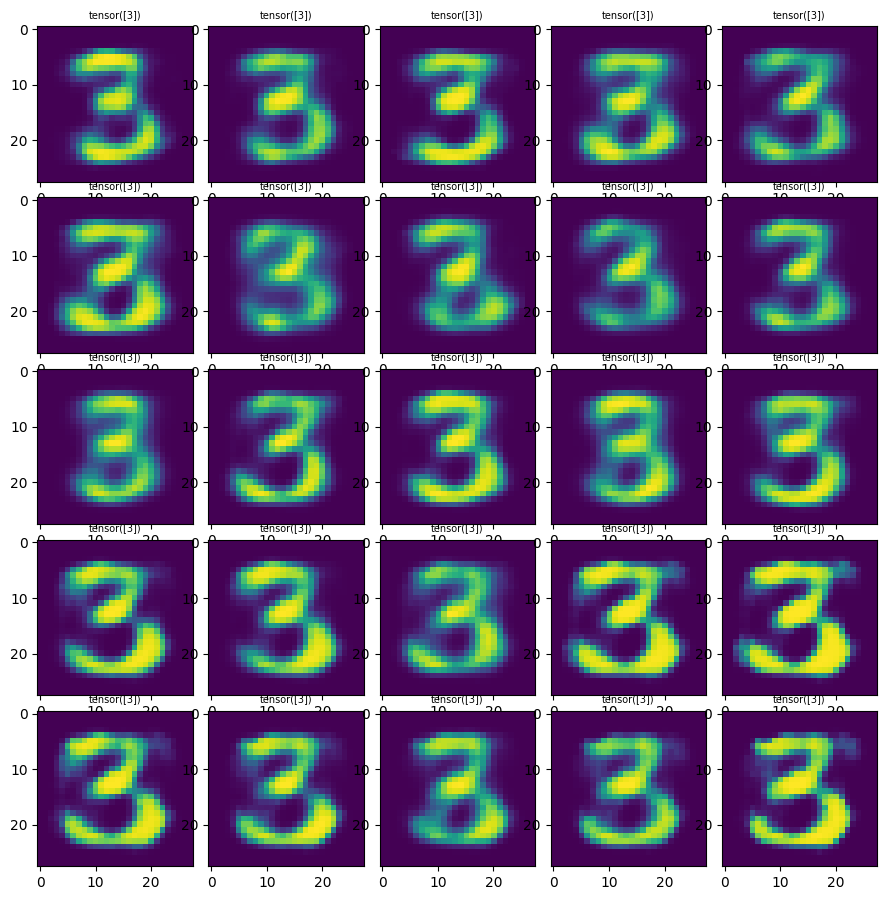

In [ ]:
display_output_img_0(l_xhat_detached_0)

# Visualisation of vectors in latent space.

- In latent space, vector size is 20 features long.
- A that stage, in latent space, vectors have not proper size (should be 28*28=784) to be displayed as images.
- But we can use t-sne method and see how wide images are spread.

# ---------------

- Latent space vectors appended in l_z_sampled.
- Using t-sne allow to highlight similiraties between vectors.

In [ ]:
l_z_detached = [tensor.detach().numpy() for tensor in l_z_sampled]
print('---------- Begining of Prints ------------')
print()
print(len(l_z_detached))
print(len(l_z_detached), type(l_z_detached[0]), l_z_detached[0].shape)
print()
print('----------')
print()
as_array = np.asarray(l_z_detached)
print(type(as_array), as_array.shape)
print(as_array[0].shape)
print(as_array[0])
print()
print('---------- End of Prints ------------')


---------- Begining of Prints ------------

479992
479992 <class 'numpy.ndarray'> (1, 20)

----------

<class 'numpy.ndarray'> (479992, 1, 20)
(1, 20)
[[-1.1233116   0.23498532 -2.391098    0.6215233  -0.5703676   1.0545609
  -0.6778693  -0.24978465  0.18624912 -0.9699231  -0.5608532  -0.24008924
  -0.33093965  1.823381    1.2976046  -0.52321625 -0.80134624 -0.4270234
   0.33589447 -0.2614572 ]]

---------- End of Prints ------------


## Preprocess of data: Projection of 20 dimension vectors into 2 dimension space, use t-sne technique.

In [ ]:
X = as_array.reshape(-1, as_array.shape[2])
print(type(X), X.shape)

<class 'numpy.ndarray'> (479992, 20)


In [ ]:
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X)

## Display scatter of vectors in 2D space.

In [ ]:
X_tsne.shape

(479992, 2)

In [ ]:
np.asarray(l_labels).shape

(479992, 1)

In [ ]:
q = np.asarray(l_labels).reshape(479992)
q.shape

(479992,)

In [ ]:
fig = px.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], color=np.asarray(l_labels).reshape(479992))
fig.update_layout(
    title="t-SNE visualization of Custom Classification dataset",
    xaxis_title="First t-SNE",
    yaxis_title="Second t-SNE",
)
fig.show()

In [ ]:
def display_latentspace(l_x_hat):
    # nb images que l'on veut afficher = nb
    nb = 60
    n_cols = 5
    n_rows = nb//n_cols
    figure, axes = plt.subplots(n_rows, n_cols, figsize = (10, 10))
    #plt.tight_layout(pad=7.0)
    plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=1.5,
                    top=1.5,
                    wspace=0.1,
                    hspace=0.1)

    for i, ax in enumerate(axes.flatten()):
        img = l_x_hat[i]
        #print(type(img), img.shape)
        img = img.permute(1, 2, 0)
        img = img.detach().numpy()
        #if j >= (epochs-nb):
        if i <= nb:
            ax.imshow(img)
            ax.set_title('Img. n°' + str(i), fontsize=6)
    plt.show()
    return

As mentioned in the answer by Jim J, sigmoid forces the output to the range [0, 1]. In this case, it's not because we want to interpret the output as a probability, rather it's done to force the output to be interpreted as pixel intensity of a grey scale image.

If you remove the sigmoid, the NN will have to learn that all the outputs should be in the range [0, 1]. The sigmoid might help making the learning process more stable.

In [ ]:
input_img = torch.randn(10, 1, 5, 5)

In [ ]:
input_img.shape

In [ ]:
input_img

In [ ]:
start_dim = 1
end_dim = -1

in_features_mod = nn.Flatten(start_dim=start_dim, end_dim=end_dim)
relu = nn.ReLU()

In [ ]:
in_features = in_features_mod(input_img)
in_features.size()

In [ ]:
linear = nn.Linear(in_features.shape[1],2, bias=True, dtype=torch.float)

In [ ]:
output_linear = linear(in_features)

In [ ]:
output_linear

In [ ]:
relu(output_linear)

In [ ]:
prix_cadre = 1000
prix_bat = 500

In [ ]:
class Velo():
    def __init__(self, prix_cadre, prix_bat):
        self.prix_cadre = prix_cadre
        self.prix_bat = prix_bat
    def calc(self):
        prix = self.prix_cadre + self.prix_bat
        return prix

In [ ]:
e_velo = Velo(prix_cadre, prix_bat)

In [ ]:
e_velo.calc()

In [ ]:
super_bat = 2000

In [ ]:
class Velo_power(Velo):
    def __init__(self, super_bat):
        super().__init__(prix_cadre, prix_bat)
        self.super_bat = super_bat

    def calc(self):
        prix = super().calc() + self.super_bat
        return prix


In [ ]:
my_supervelo = Velo_power(super_bat)

In [ ]:
my_supervelo.calc()